### Overview

Continue from where we left off on Tues:

3. Quality control, Normalization
4. Dimensionality reduction with PCA
5. Cell-cell distances
6. Unsupervised clustering with Leiden

#### Speed run through Tuesday's analysis steps
Remember to install packages, fetch data, etc first -- see last notebook as needed.

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

/opt/homebrew/Caskroom/miniforge/base/envs/autocluster/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/opt/homebrew/Caskroom/miniforge/base/envs/autocluster/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/opt/homebrew/Caskroom/miniforge/base/envs/autocluster/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/opt/homebrew/Caskroom/miniforge/base/envs/autocluster/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/opt/homebrew/Caskroom/min

In [2]:
# change this to the path that works for you
ad10f = sc.read_10x_h5("../../../data/pbmc_10k_v3_filtered_feature_bc_matrix.h5")

In [3]:
ad10f.var_names_make_unique()

In [4]:
ad10f.layers['counts'] = ad10f.X.copy()
ad10f.layers

Layers with keys: counts

In [ ]:
ad10f.obs_names

Index(['AAACCCAAGCGCCCAT-1', 'AAACCCAAGGTTCCGC-1', 'AAACCCACAGAGTTGG-1',
       'AAACCCACAGGTATGG-1', 'AAACCCACATAGTCAC-1', 'AAACCCACATCCAATG-1',
       'AAACCCAGTGGCTACC-1', 'AAACCCATCCCGAGAC-1', 'AAACCCATCTGGCCGA-1',
       'AAACCCATCTGTTCAT-1',
       ...
       'TTTGTTGGTAGCACGA-1', 'TTTGTTGGTATCAGCT-1', 'TTTGTTGGTCGGTGAA-1',
       'TTTGTTGGTCTGTAAC-1', 'TTTGTTGGTGCGTCGT-1', 'TTTGTTGGTGTCATGT-1',
       'TTTGTTGGTTTGAACC-1', 'TTTGTTGTCCAAGCCG-1', 'TTTGTTGTCTTACTGT-1',
       'TTTGTTGTCTTCTAAC-1'],
      dtype='object', length=11769)

In [ ]:
ad10f.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231C'],
      dtype='object', length=33538)

To subset annData, just specfiy the cells and genes:

In [8]:
genes_monocyte = ["CD14", "CD68", "LYZ"]
adSubset = ad10f[:10, genes_monocyte]
adSubset.shape

(10, 3)

Select cells that express CD14, CD68, and LYZ:

In [ ]:
gene_mask = ad10f[:,genes_monocyte].X > 0
gene_mask = gene_mask.toarray()
passing_cells = np.all(gene_mask, axis=1) # could use np.any to allow a cell expressing any of these genes to pass
adMono = ad10f[passing_cells]
adMono.shape

(3262, 33538)

Other slots in adata:
- .obsm and .varm: multidimensional metadata
- .obsp and .varp: metadata on paired cells and paired genes

We will revisit these later.

<div class="alert alert-block alert-success"><b>Views</b><br>
Views are pointers to memory where original anndata is stored. They are <b>not</b> copies of the variable.
</div>

Let's add some cell metadata

In [9]:
ad10f.obs['sample_name'] = "sample_1"
print(ad10f.obs.columns)

Index(['sample_name'], dtype='object')


### START Lecture 4 here ->> Quality Control (QC)
Broadly speaking there are two things that we apply quality control to:
1. Cells: We want to find putative doublets and low quality cell barcodes and ehold them out of downstream analysis (or at least tag them).
2. Genes: We also can remove genes that are not detected in the vast majority of cell

The function `sc.pp.calculate_qc_metrics()` will calculate a set of metrics on adata and places the results in .obs and .var. The results can then be used to filter the adata. `pp.calculate_qc_metrics()` can also take inputs to specify other, custom metrics to compute. Below, we use it to compute the fraction of all UMIs in each cell that are mitochondrially encoded or that encode for ribosomal genes.

In [5]:
ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

#### Visualize
Take a look some typical QC values across these data

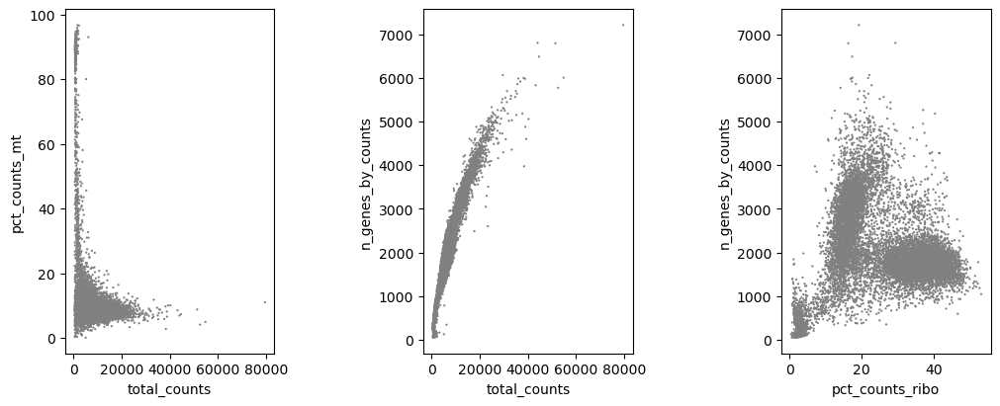

In [6]:
adClean = ad10f.copy()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25}, constrained_layout=True)
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

Now, do the filtering.

First, keep cells with fewer than 20% mitochondrially encoded gene total UMIs

In [7]:
adClean = adClean[adClean.obs['pct_counts_mt']<20,:]
adClean.n_obs

11047

- Second, filter based on total number of genes detected (at least 500).
- Third, filter based on total number of counts (fewer than than 30,000)
- Fourth, keep genes that are detected in at least 10 cells.

In [8]:
adClean.var_names_make_unique()
sc.pp.filter_cells(adClean, min_genes=500)
print(adClean.n_obs)

sc.pp.filter_cells(adClean, max_counts=30000)
print(adClean.n_obs)

sc.pp.filter_genes(adClean, min_cells=10)
print(adClean.shape)

10924
10891
(10891, 17422)


In [9]:
?sc.pp.filter_genes

Signature:
sc.pp.filter_genes(
    data: 'AnnData | spmatrix | np.ndarray | DaskArray',
    *,
    min_counts: 'int | None' = None,
    min_cells: 'int | None' = None,
    max_counts: 'int | None' = None,
    max_cells: 'int | None' = None,
    inplace: 'bool' = True,
    copy: 'bool' = False,
) -> 'AnnData | tuple[np.ndarray, np.ndarray] | None'
Docstring:
Filter genes based on number of cells or counts.

Keep genes that have at least `min_counts` counts or are expressed in at
least `min_cells` cells or have at most `max_counts` counts or are expressed
in at most `max_cells` cells.

Only provide one of the optional parameters `min_counts`, `min_cells`,
`max_counts`, `max_cells` per call.

Parameters
----------
data : 'AnnData | spmatrix | np.ndarray | DaskArray'
    An annotated data matrix of shape `n_obs` × `n_vars`. Rows correspond
    to cells and columns to genes.
min_counts : 'int | None', optional (default: None)
    Minimum number of counts required for a gene to pass filterin

### Normalization
Simple library size scaling, then log transform. There are many other ways to correct for cell-to-cell technical variation, for example different cell lysis efficiencies, but this method is good enough for this data set and our goals.

In [10]:
adNorm = adClean.copy()
sc.pp.normalize_total(adNorm , target_sum=1e4)
sc.pp.log1p(adNorm)

In [19]:
adNorm.obs['sample_name'] = 'sample_1'

### Highly variable genes (HVG)
It is common practice to limit some parts of analysis to those variables or genes that exhibit some degree of variation in their values across the data. We call these <i>highly variable genes</i>, or HVG for short. The rationale is that these genes are differentially regulated between populations within the sample. There are different ways to identify such genes. In one approach, a normalized dispersion is calculated for each gene and the top_n genes (e.g. top_n = 2,000) with the highest normalized dispersions are considered highly variable. This approach recognizes that expression variation scales with mean expression, and so it first groups genes into bins based on their mean expression. Then it computes the mean and standard deviation of dispersion for each bin. Finally it computes the normalized dispersion for each gene as dispersion - mean_dispersion / std_dispersion.

BTW: <i>dispersion</i> = variance / mean (and Variance is just expected squared deviation of gene expression)



In [11]:
n_hvg = 2000
sc.pp.highly_variable_genes(adNorm, n_top_genes=n_hvg, flavor='cell_ranger')
# sc.pp.highly_variable_genes(adNorm , min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var

,gene_ids,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,60,0.005183,99.490186,61.0,60,False,0.004502,0.917161,-0.060098
AL669831.5,ENSG00000237491,Gene Expression,GRCh38,False,False,679,0.062367,94.230606,734.0,665,False,0.048407,0.856350,-0.258551
FAM87B,ENSG00000177757,Gene Expression,GRCh38,False,False,13,0.001190,99.889540,14.0,13,False,0.000770,0.719899,-1.331091
LINC00115,ENSG00000225880,Gene Expression,GRCh38,False,False,350,0.031269,97.026085,368.0,337,False,0.024243,0.848471,-0.828740
FAM41C,ENSG00000230368,Gene Expression,GRCh38,False,False,313,0.027190,97.340471,320.0,308,False,0.022719,0.883760,-0.320399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC011043.1,ENSG00000276256,Gene Expression,GRCh38,False,False,77,0.006882,99.345739,81.0,74,False,0.005875,0.988261,0.642865
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,False,False,32,0.002719,99.728099,32.0,30,False,0.002267,0.978485,0.592432
AC007325.4,ENSG00000278817,Gene Expression,GRCh38,False,False,239,0.020902,97.969241,246.0,233,False,0.015576,0.787513,-1.681796
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,False,False,319,0.028210,97.289489,332.0,303,False,0.023072,0.906420,0.006022


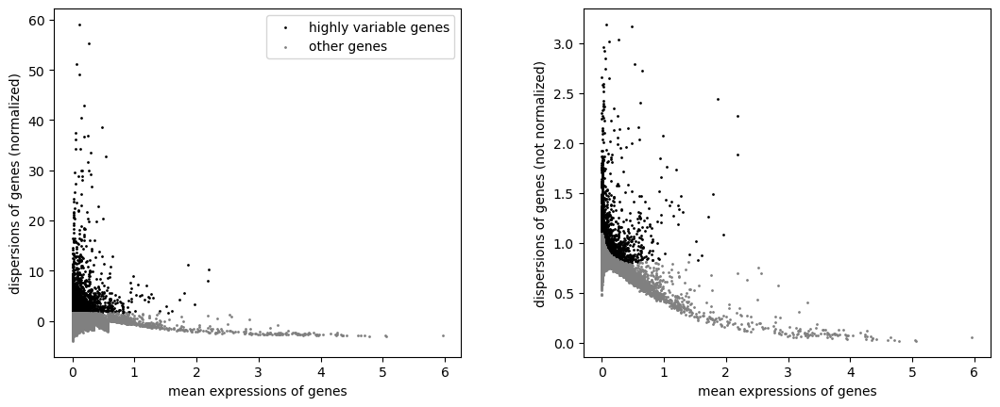

In [12]:
sc.pl.highly_variable_genes(adNorm)

### Dimensionality reduction with Principal components analysis (PCA)

Why performan dimentaionality reduction?

1. Genes are expressed in coordinated fashion, meaning that many have correlated expression patterns and so PCA reduces the computational complexity of downstream analysis
2.  scRNA-seq data is noisy on a per gene basis.

PCA allows us to reduce a high dimensional data set into a lower dimension in which much of the total variation is maintained. To understand PCA, you need to know linear algebra. In essence, it identifies sets of linear combinations of genes (PCs) in such a way that each PC uncorrelated with others, and such that PC1 has the maiximum variation, then PC2, and so on. The function call `sc.tl.pca` does the following:

1. computes the covariance matrix (correlation between each pair of genes)
2. finds eigenvectors (directions of axes that maximize that variance), orthogonal to each other
3. stores results in `.uns['pca']`, `.obsm['X_pca']`, `.varm['PCs']`

Later, we select a threshold (n_pcs) as the number of PCs that contribute most to the total variation on our data. We use these _n_pcs_ PCs to compute cell-to-cell distances for embedding (2D visualization via UMAP) and for clustering of cells.




In [13]:
adNorm

AnnData object with n_obs × n_vars = 10891 × 17422
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [14]:
sc.tl.pca(adNorm , mask_var='highly_variable')
adNorm

AnnData object with n_obs × n_vars = 10891 × 17422
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [15]:
type(adNorm.uns['pca'])
adNorm.uns['pca'].keys()

dict_keys(['params', 'variance', 'variance_ratio'])

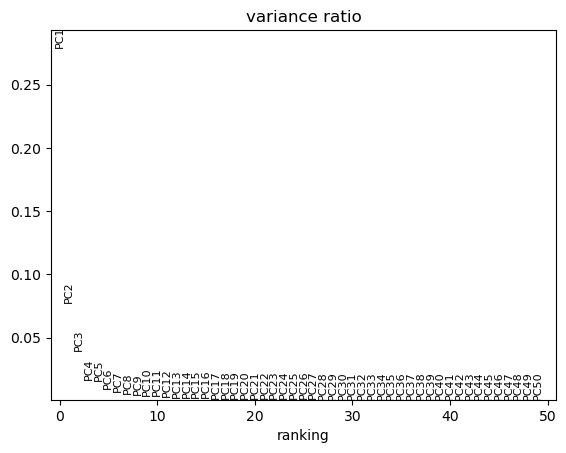

In [16]:
sc.pl.pca_variance_ratio(adNorm, 50) # variation per PC

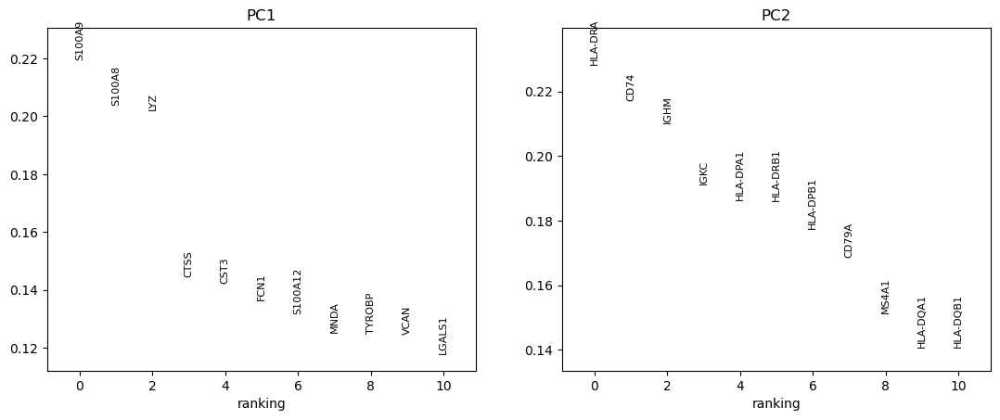

In [17]:
# Loadings -- the gene 'weights' for PC1 and PC2
sc.pl.pca_loadings(adNorm, components = [1,2], n_points=10, include_lowest=False)

### Marker genes
Here PBMC cell types and some genes that have been used to identify them:<br>

**Monocytes**: CD14, CD68, LYZ<br>
**Dendritic**: CLEC4C, FLT3<br>
**NK cells**: GNLY, NCAM1<br>
**B cells**: CD19, CD79A, CD79B<br>
**T cells**: CD3D, CD3E, TRAC, TRBC<br>


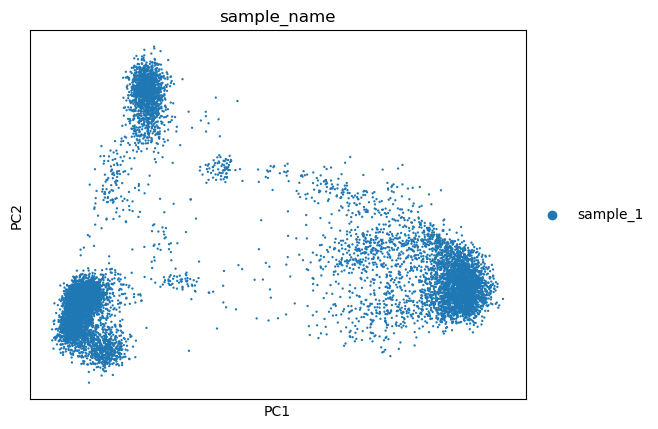

In [20]:
sc.pl.pca(adNorm , color=['sample_name'], ncols=1)

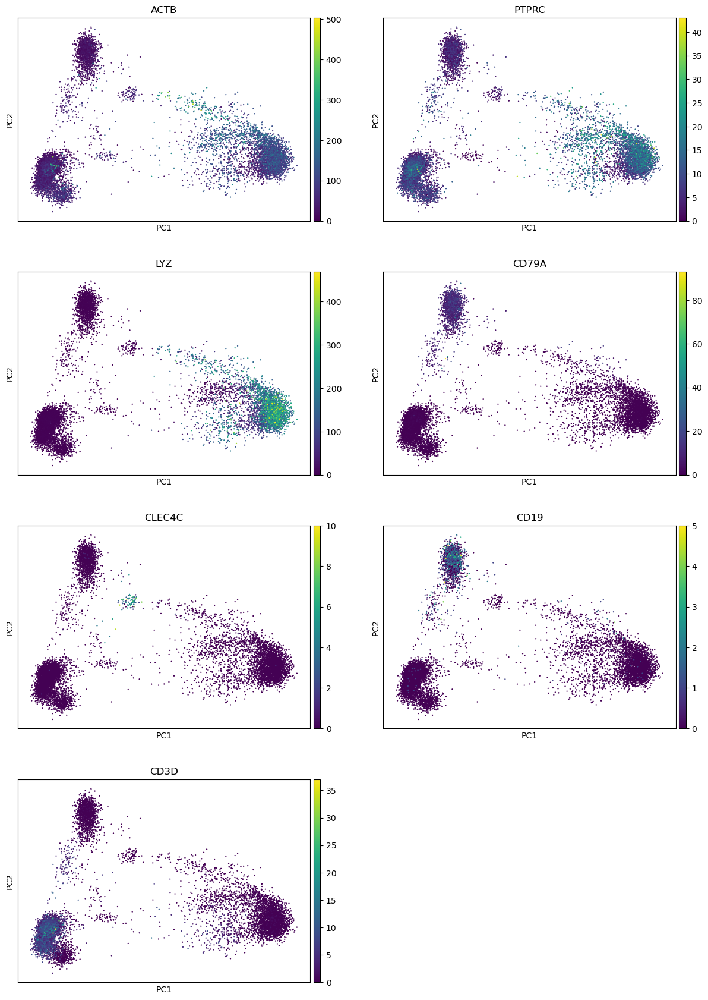

In [21]:
markerGenes = ['ACTB', 'PTPRC', 'LYZ','CD79A', 'CLEC4C', 'CD19', 'CD3D']
sc.pl.pca(adNorm , color=markerGenes, ncols=2, layer='counts')

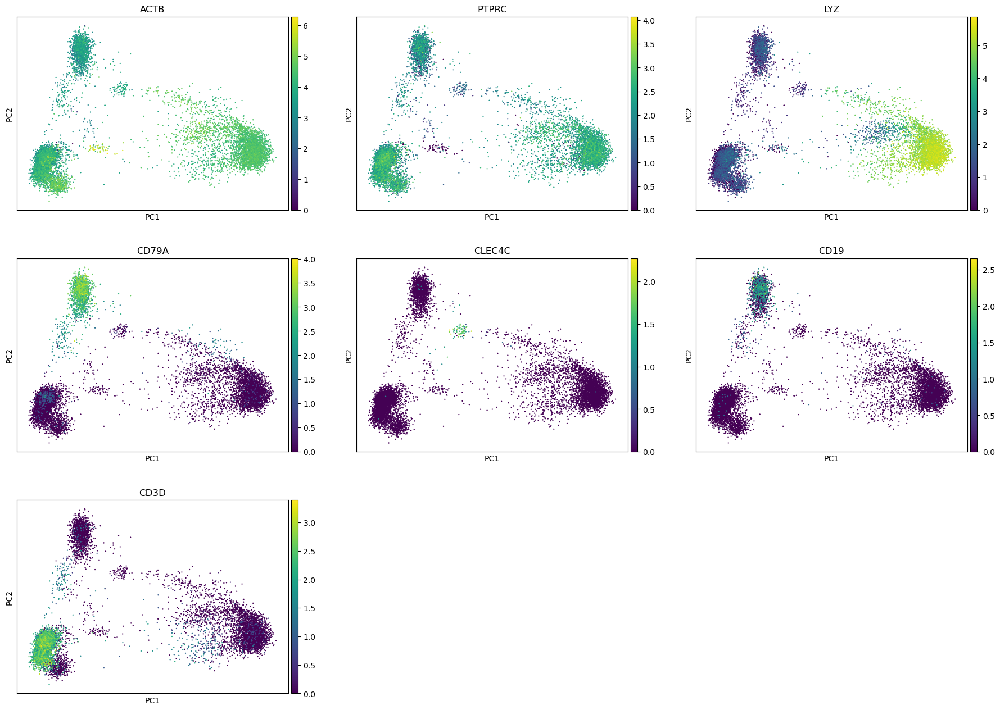

In [22]:
sc.pl.pca(adNorm , color=markerGenes, ncols=3)

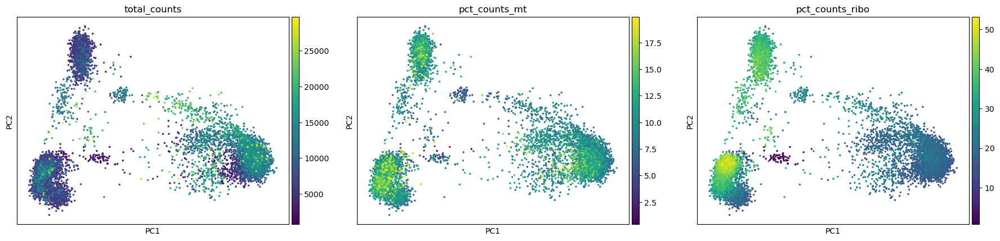

In [23]:
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)

#### kNN cell-cell distances
The k-nearest neighbor graph generates an adjacency matrix by finding, for each cell, the k cells that are closest to it. This helps to reduce noise in computing cell-cell distances or similarities and is important for embedding the cells in a 2D space, and for community detection algorithms. Two arguments are n_neighbors, or _k_, and the number of PCs to use when computing cell-cell distances.

In [24]:
n_neighbors = 20 # tunable
n_pcs = 10 # this too
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
adNorm

AnnData object with n_obs × n_vars = 10891 × 17422
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'n_counts', 'sample_name'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'sample_name_colors', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

### Visualization of cell-cell similarities

#### UMAP embedding
This an elaboration on the t-SNE embedding approach. Both of these methods try to project cells into a reduced (typically 2) dimensional coordinate system while maintaining both the global and local structure of the high dimensional space of the data (i.e. cells that are distant from each other high dimensions should still be distant in the reduced embedding; same is true for cells that are near each other). The distances come from the kNN graph.

In [25]:
sc.tl.umap(adNorm)

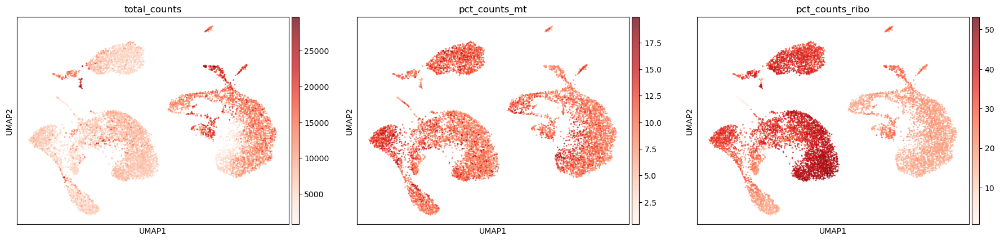

In [26]:
sc.pl.umap(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], alpha=.75, s=15, cmap='Reds')

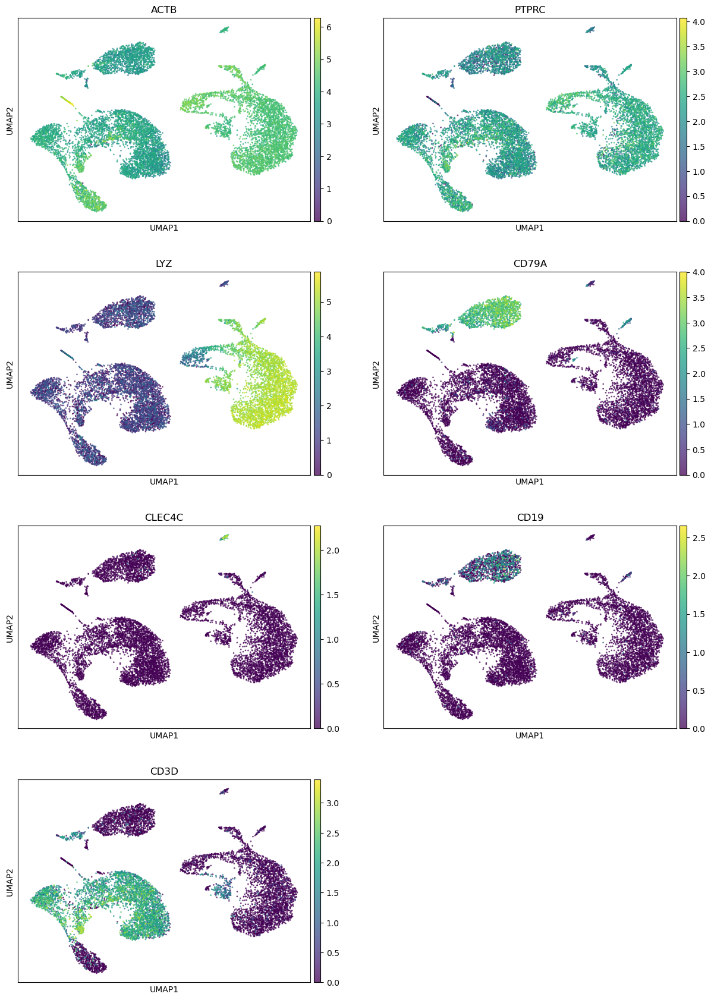

In [27]:
sc.pl.umap(adNorm, color=markerGenes, alpha=.75, s=15, ncols=2)

There are lots of ways to customize our plots. See the Scanpy [visualization documentation](https://scanpy.readthedocs.io/en/stable/tutorials/plotting/advanced.html) for details. Here, lets change the colors and remove the boxes and axes labels.

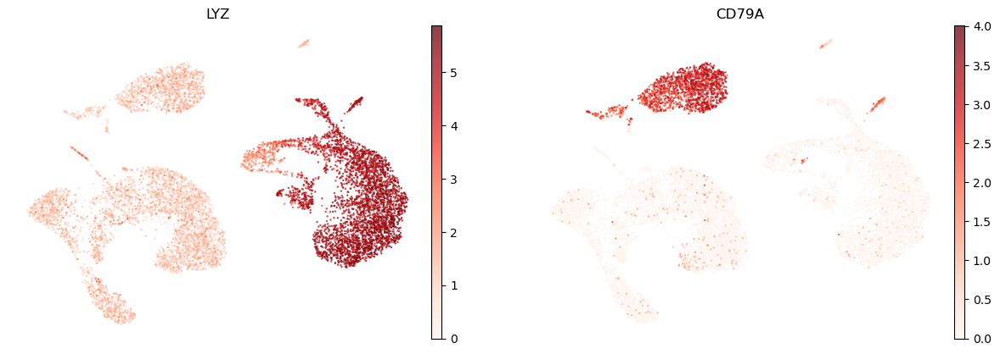

In [30]:
sc.pl.umap(adNorm, color=['LYZ', 'CD79A'], alpha=.75, s=12, frameon=False, ncols=2, legend_fontoutline=2,legend_fontsize=14, cmap="Reds")

### Unsupervised clustering

Let's try to assign cells to distinct groups or clusters based on the cell-to-cell distances. Leiden and Louvain are examples of community detection methods that perform this task by searching for the group assignment that maximize within group similarity (which is equivalent to within group edges of a knn graph) and to minimize between group similarity.


In [31]:
clustering_name = "leiden_cluster"
sc.tl.leiden(adNorm, 0.1, flavor="igraph", n_iterations=2,key_added=clustering_name)

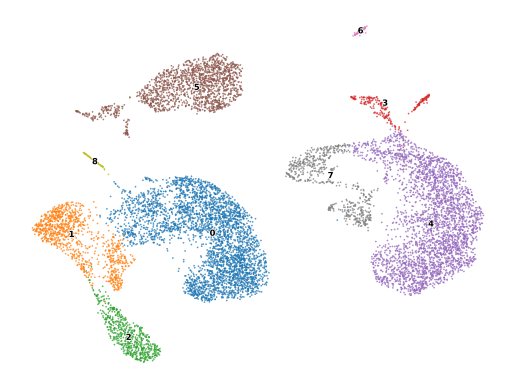

In [32]:
sc.pl.umap(adNorm, color=[clustering_name], alpha=.75, s=6,
           legend_loc='on data', frameon=False, ncols=1,legend_fontoutline=1,legend_fontsize=6,
           cmap="Reds", use_raw=False, title='')

Make a figure that shows the embedding and expression of marker genes side-by-side. Note that I am adding markers for T cell, B cell, and Monocyte sub-types

categories: 0, 1, 2, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


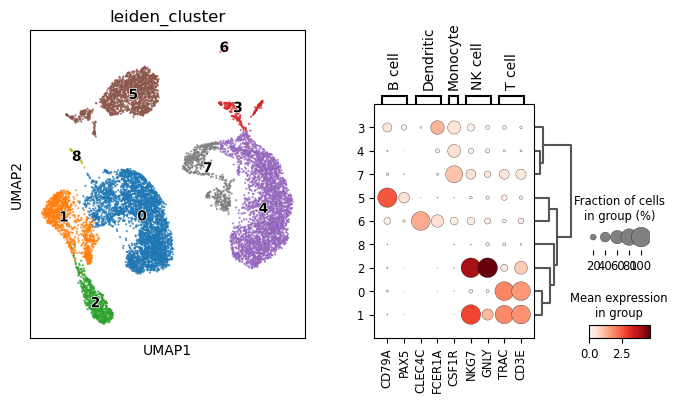

In [33]:
marker_genes_broad_dict = {
    'B cell': ['CD79A', 'PAX5'],
    'Dendritic': ['CLEC4C', 'FCER1A'],
    'Monocyte': ['CSF1R'],
    'NK cell': ['NKG7', 'GNLY'],
    'T cell': ['TRAC', 'CD3E'],
}
sc.tl.dendrogram(adNorm, groupby=clustering_name)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=[clustering_name], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False, legend_fontoutline=1)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, groupby=clustering_name, dendrogram=True,ax=ax2, show=False)
plt.show()

### Cluster annotation
We can walk down the rows of the dotplot and guess at the cell types of some of these clusters based on the specificty of marker expression:
NB: The cluster labels are likely to be different when you run this. In fact, when I re-run this notebook on my laptop instead of from Colab, they _are_ different, which is really annoying!

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 3       | B, Dendritic, Mono   | ???             |
| 4       | Monocyte             | Monocyte        |
| 7       | Monocyte, T, NK      | ???            |
| 6       | Dendritic   | Dendritic             |
| 5       |   B | B |
| 8 | none | mystery |
| 2 | NK, T   | ???   |   
| 0  | T cell | T cell |
| 1 |  NK, T | ??? |

Some clusters are ambiguous because they express markers of more than one cell type. This could be due to the cluster containing > 1 cell type, or because the cell barcodes are doublets. If the former, then we should be able to sub cluster them. Let's try this.

Clusters to refine are 3, 7, 2, and 1.

In [36]:
to_sub = "3"
nname = "sub_" + to_sub
sc.tl.leiden(adNorm,.1, restrict_to=[clustering_name,[to_sub]], key_added = nname)

categories: 0, 1, 2, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


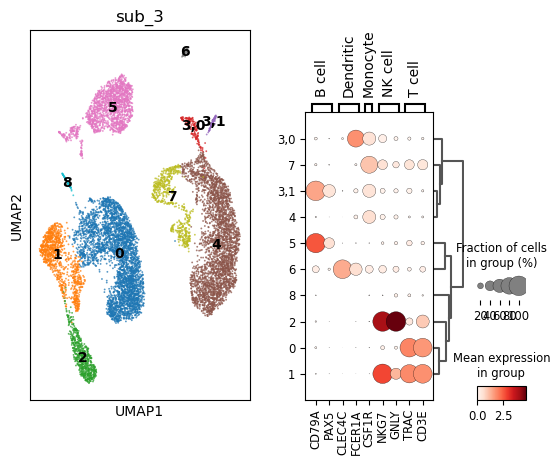

In [37]:
sc.tl.dendrogram(adNorm, groupby=nname)
fig, (ax1, ax2) = plt.subplots(1, 2, gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=nname, alpha=.75, s=7, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, groupby=nname, dendrogram=True,ax=ax2, show=False)
plt.show()

Cluster 3 is split into 2 clusters now. Both of these sub-clusters express the Monocyte marker CSf1R, but are distinguished by their expression of dendritic marker FCER1A and the B cell genes CD79A and PAX5. Let's look at the QC metrics to see if that can give us additional hints as to whether these are real cells or are doublets.

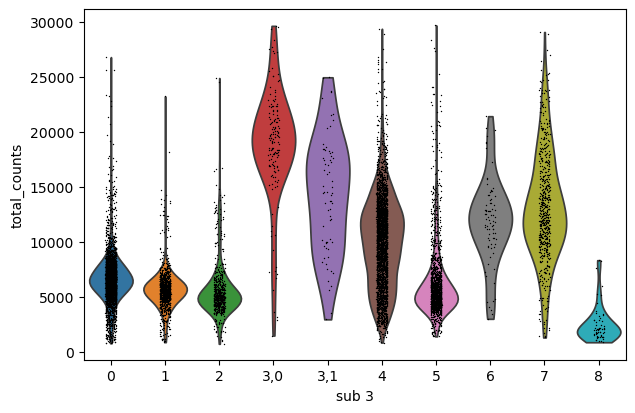

In [38]:
sc.pl.violin(adNorm, ['total_counts'], groupby=nname )

Cluster 3 (and each sub-cluster) has a high number of Total counts. So let's annotate these as 'doublet'.

What about the other questionable clusters 7, 2, and 1? Can we refine those?

categories: 0, 1, 2, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


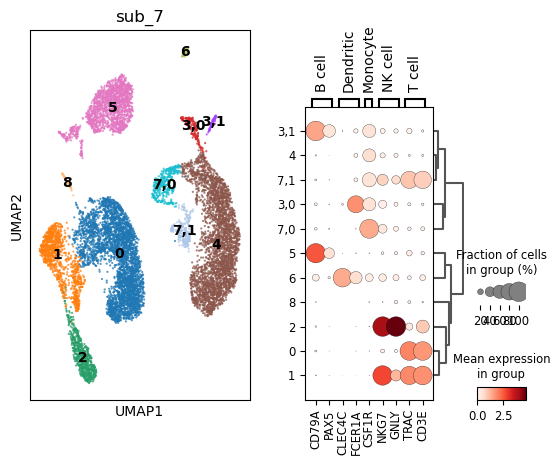

In [39]:
# cluster 7
cname = nname
to_sub = "7"
nname = "sub_" + to_sub

sc.tl.leiden(adNorm,.05, restrict_to=[cname,[to_sub]], key_added = nname)
sc.tl.dendrogram(adNorm, nname)
fig, (ax1, ax2) = plt.subplots(1, 2,  gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=nname, alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, nname, dendrogram=True,ax=ax2, show=False)
plt.show()

It looks like 7,1 is a multiplet, and 7,0 is monocyte. What about cluster 2?

categories: 0, 1, 2,0, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


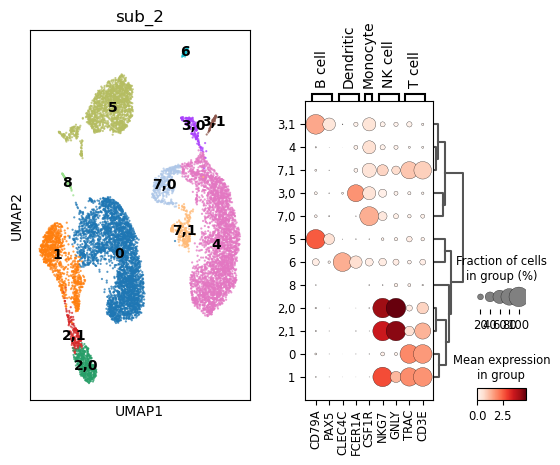

In [40]:

cname = nname
to_sub = "2"
nname = "sub_" + to_sub

sc.tl.leiden(adNorm,.15, restrict_to=[cname,[to_sub]], key_added = nname)
sc.tl.dendrogram(adNorm, nname)
fig, (ax1, ax2) = plt.subplots(1, 2,  gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=nname, alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, nname, dendrogram=True,ax=ax2, show=False)
plt.show()

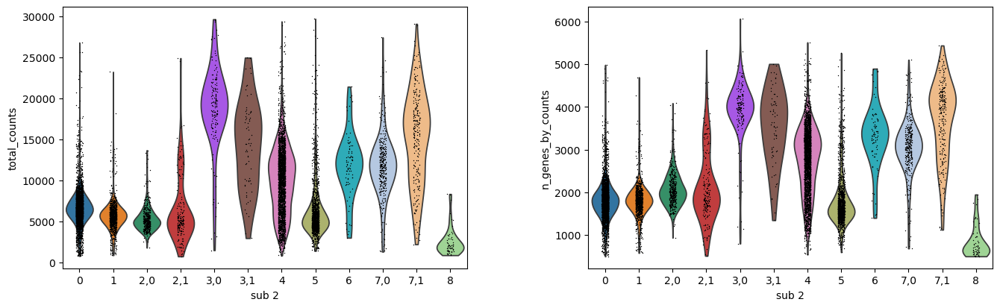

In [41]:
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby=nname )

cluster 2 does not seem to be a composite. I think 2 is just NK.

categories: 0, 1,0, 1,1, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


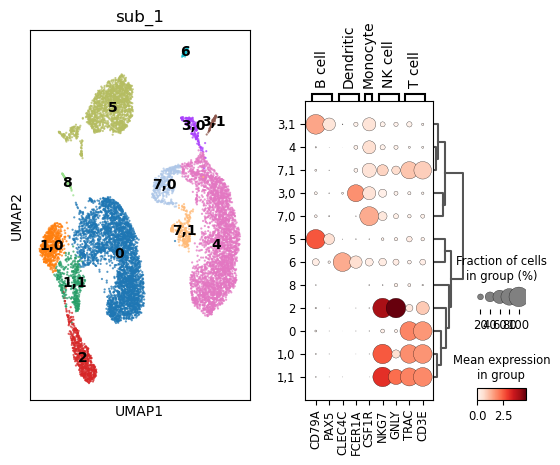

In [45]:
cname = "sub_7"
to_sub = "1"
nname = "sub_" + to_sub

sc.tl.leiden(adNorm,.1, restrict_to=[cname,[to_sub]], key_added = nname)
sc.tl.dendrogram(adNorm, nname)
fig, (ax1, ax2) = plt.subplots(1, 2,  gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=nname, alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, nname, dendrogram=True,ax=ax2, show=False)
plt.show()

Unsure about 1,0 and 1,1: they have low-ish counts, but appear to be NK/T composites. Let's compile everything else so far:


| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 3,0       | Dendritic, Mono   | Doublet           |
| 3,1       | B, Mono   | Doublet            |
| 4       | Monocyte             | Monocyte        |
| 7,1       | Monocyte, T, NK      | Multiplet            |
| 7,0       | Monocyte,     | Monocyte             |
| 6       | Dendritic   | Dendritic             |
| 5       |   B | B |
| 8 | none | mystery |
| 2 | NK   | NK   |   
| 0  | T cell | T cell |
| 1,0 |  NK, T | ??? |
| 1,1 |  NK, T | ??? |



Look at sub-type markers.

categories: 0, 1,0, 1,1, etc.
var_group_labels: B cell, Dendritic, CD14 monocyte, etc.


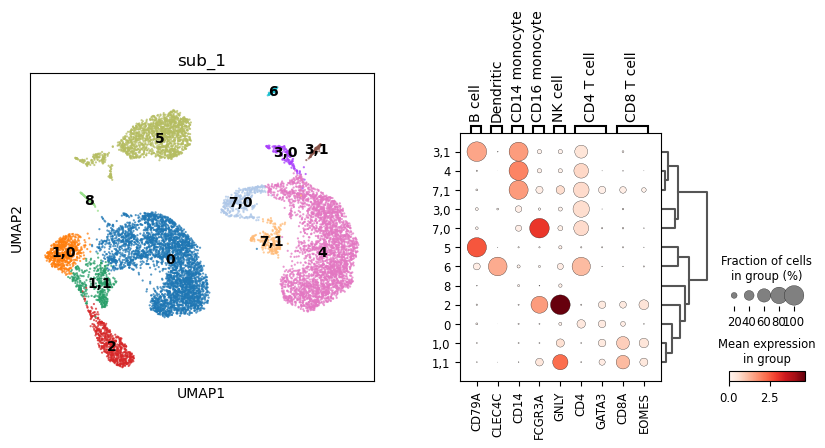

In [46]:
marker_genes_sub_dict = {
    'B cell': ['CD79A'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

sc.tl.dendrogram(adNorm, nname)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=nname, alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, nname, dendrogram=True,ax=ax2, show=False)
plt.show()

We are close to a final annotation now:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 3,0       | Dendritic, Mono   | Doublet           |
| 3,1       | B, Mono   | Doublet            |
| 4       | CD14 Monocyte             | Monocyte CD14        |
| 7,1       | Monocyte, T, NK      | Multiplet            |
| 7,0       | Monocyte CD16     | Monocyte CD16             |
| 6       | Dendritic   | Dendritic             |
| 5       |   B | B |
| 8 | none | mystery |
| 2 | NK   | NK   |   
| 0  | T cell | T cell CD4|
| 1,0 |  NK, T | T cell CD8 |
| 1,1 |  NK, T | T cell CD8 |

But what is cluster 8? It has low counts. If it is just ambient 'soup', then we would not expect it to have high levels of cell type specific genes. Let's do differential gene expression analysis to see what is upregulated in this cluster.

In [53]:
nname

'sub_1'

### Differential gene expression

In [47]:
sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby=nname)

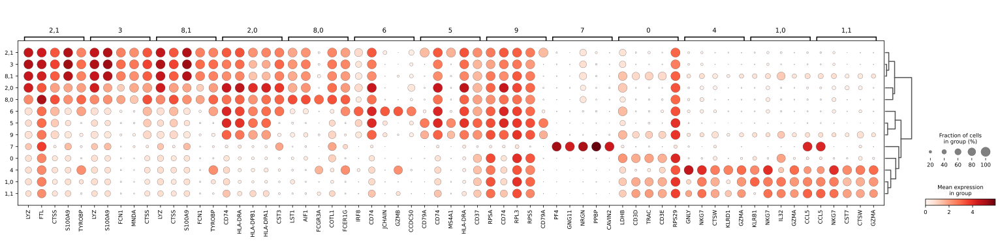

In [62]:
# sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby=nname, dendrogram=True, key='rank_genes_groups')

categories: 0, 1,0, 1,1, etc.
var_group_labels: 8


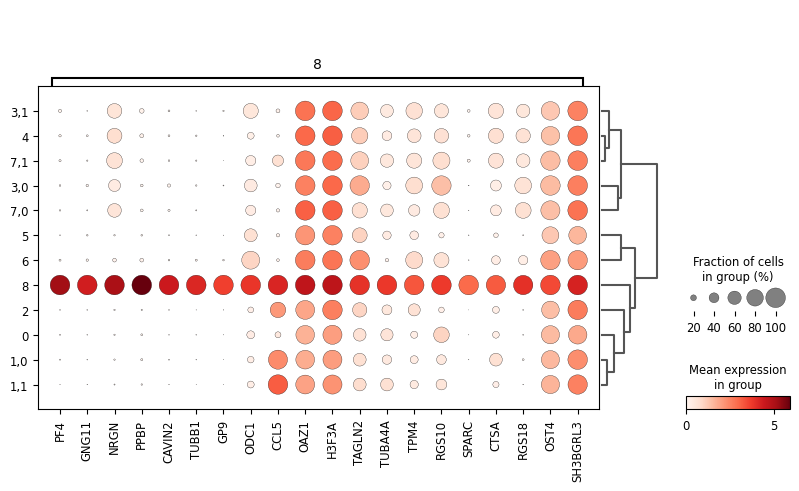

In [49]:
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby=nname, dendrogram=True, key='rank_genes_groups', groups=['8'])

Although this result could be refined and explored a lot, it is sufficient for us to address our question about the identity of cluster 7 as follows:

<figure>
    <img src="https://github.com/compscbio/cscb2026/blob/gh-pages/notebooks/img/ChatGPT_cellguess.png?raw=1" alt="Help from ChatGPT" width="600">
    <figcaption>Help from ChatGPT to annotate cells</figcaption>
</figure>


Now, let's add the annotation to the anndata.obs and discard the other cells

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 3,0       | Dendritic, Mono   | Doublet           |
| 3,1       | B, Mono   | Doublet            |
| 4       | CD14 Monocyte             | Monocyte CD14        |
| 7,1       | Monocyte, T, NK      | Multiplet            |
| 7,0       | Monocyte CD16     | Monocyte CD16             |
| 6       | Dendritic   | Dendritic             |
| 5       |   B | B |
| 8 | Plat | Platelet |
| 2 | NK   | NK   |   
| 0  | T cell | T cell CD4|
| 1,0 |  NK, T | T cell CD8 |
| 1,1 |  NK, T | T cell CD8 |

In [54]:
tokeep = ["4", "7,0", "6", "5", "8", "2", "0", "1,0", "1,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs[nname].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs[nname].value_counts()

sub_1
0      3553
4      3123
5      1602
2       623
1,0     622
1,1     406
7,0     354
6        81
8        61
Name: count, dtype: int64

In [55]:
cell_dict = {'Dendritic': ['6'],
             'CD14 Monocyte': ['4'],
             'CD16 Monocyte': ["7,0"],
             'B cell': ['5'],
             'Platelet': ['8'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["1,0", "1,1"],
             'NK cell': ["2"]
}

marker_genes_dict = {
    'B cell': ['CD79A'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES'],
    'Platelet': ['PF4', 'CAVIN2']
}


new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs[nname]).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")


categories: B cell, CD14 Monocyte, CD16 Monocyte, etc.
var_group_labels: B cell, Dendritic, CD14 monocyte, etc.


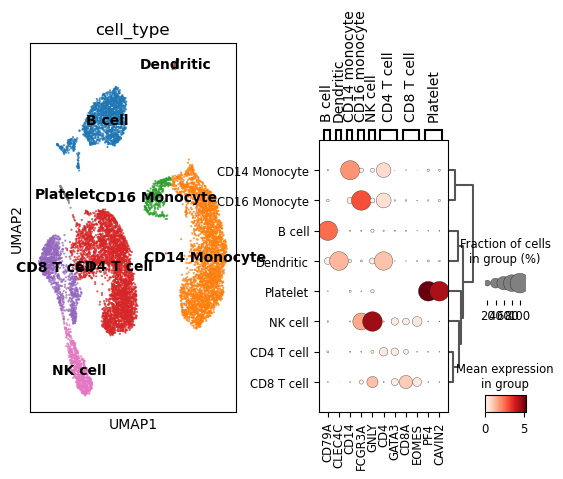

In [56]:
sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_dict, 'cell_type', dendrogram=True,ax=ax2, show=False)
plt.show()


In [68]:
sc.pl.pca(adNorm2, color=['cell_type', 'GNLY'], alpha=.75, s=15, projection='3d')

#### Differential expression analysis
Let's identify genes that are preferenntially expressed in each cluster versus all the others as a final step to annotate these clusters and to remove ones that are likely to be doublets.

In [57]:
sc.tl.rank_genes_groups(adNorm2, use_raw=False, groupby="cell_type")

##### Dot plot of differentially expressed genes
First, we will apply a filter so that we only display genes that meet additional criteria beyond statistical: fold change, % expressed in cluster, % expressed in other cells

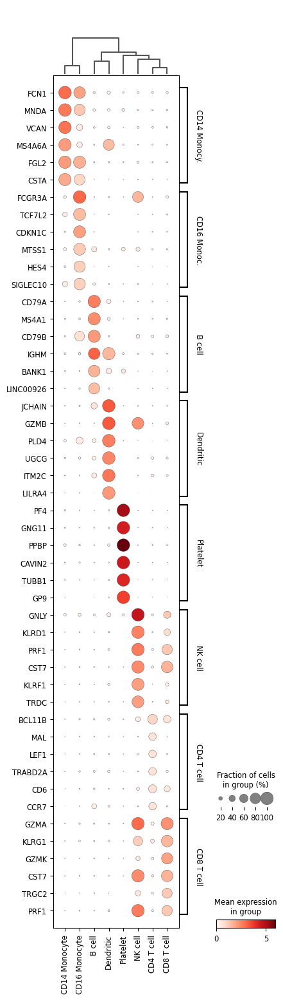

In [58]:
sc.tl.filter_rank_genes_groups(adNorm2, min_fold_change=.7, min_in_group_fraction=.5, max_out_group_fraction=.15)
sc.pl.rank_genes_groups_dotplot(adNorm2, n_genes=6, groupby="cell_type", dendrogram=True, key='rank_genes_groups_filtered', swap_axes=True)

### Resources

#### Tools
- Colab
	- https://colab.research.google.com/
- Jupyter
	- https://jupyter.org/
- CellRanger
	- https://www.10xgenomics.com/support/software/cell-ranger/latest/advanced/cr-barcode-rank-plot
	- https://www.10xgenomics.com/support/software/cell-ranger/latest/algorithms-overview/cr-gex-algorithm

#### Literature
- Best practices
    - [best practices in sc analysis online book](https://www.sc-best-practices.org/preamble.html)
	- [paper associated with the above online book](https://www.embopress.org/doi/full/10.15252/msb.20188746)
- Scanpy
	- https://scanpy.readthedocs.io/en/stable/
	- https://scanpy.readthedocs.io/en/stable/tutorials.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/plotting/advanced.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html
- AnnData
	- https://anndata.readthedocs.io/en/latest/tutorials/notebooks/getting-started.html
	- https://anndata.readthedocs.io/en/latest/index.html
- QC
	- https://genomebiology.biomedcentral.com/articles/10.1186/s13059-020-02136-7